<a href="https://colab.research.google.com/github/mr-melenas/eda_anime/blob/main/Proyecto_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#librerias necesarias
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import missingno as msno

In [ ]:
pip install kagglehub[pandas-datasets]

In [ ]:
# Install dependencies as needed:
# pip install kagglehub[pandas-datasets]
import kagglehub
from kagglehub import KaggleDatasetAdapter

# Set the path to the file you'd like to load
# file_path = "" # This was causing the error, it needs a supported file extension.
file_path = "top_anime_dataset_v2.csv" # Assuming the dataset will be saved as 'anime.csv'

# Load the latest version
df_base = kagglehub.load_dataset(
  KaggleDatasetAdapter.PANDAS,
  "quanthan/top-15000-ranked-anime-dataset-update-to-32025",
  file_path,
  # Provide any additional arguments like
  # sql_query or pandas_kwargs. See the
  # documenation for more information:
  # https://github.com/Kaggle/kagglehub/blob/main/README.md#kaggledatasetadapterpandas
)

print("First 5 records:", df_base.head())

<ipython-input-4-6b3b4fcda6cb>:11: DeprecationWarning: load_dataset is deprecated and will be removed in future version.
  df_base = kagglehub.load_dataset(


100%|██████████| 11.5M/11.5M [00:00<00:00, 55.2MB/s]


First 5 records:    anime_id                                          anime_url  \
0     52991  https://myanimelist.net/anime/52991/Sousou_no_...   
1      5114  https://myanimelist.net/anime/5114/Fullmetal_A...   
2      9253     https://myanimelist.net/anime/9253/Steins_Gate   
3     60022  https://myanimelist.net/anime/60022/One_Piece_...   
4     38524  https://myanimelist.net/anime/38524/Shingeki_n...   

                                           image_url  \
0  https://cdn.myanimelist.net/images/anime/1015/...   
1  https://cdn.myanimelist.net/images/anime/1208/...   
2  https://cdn.myanimelist.net/images/anime/1935/...   
3  https://cdn.myanimelist.net/images/anime/1455/...   
4  https://cdn.myanimelist.net/images/anime/1517/...   

                                 name                      english_name  \
0                   Sousou no Frieren     Frieren: Beyond Journey's End   
1    Fullmetal Alchemist: Brotherhood  Fullmetal Alchemist: Brotherhood   
2                       

El dataset contiene las siguientes columnas para 15,000 de los animes mejor clasificados, proporcionando una amplia gama de información y reflejando la estructura de la API de Jikan:

anime_id: Identificador único del anime en MyAnimeList (MAL ID).

anime_url: Enlace a la página del anime en MyAnimeList.

image_url: URL de la imagen principal o portada del anime (formato JPEG).

name: Título oficial del anime.

english_name: Título oficial en inglés del anime, si está disponible.

japanese_names: Título oficial en japonés del anime, si está disponible.

score: Puntuación o calificación promedio del anime en MyAnimeList (de 1 a 10, donde un número mayor es mejor).

genres: Lista de géneros asociados al anime, separados por comas (ejemplo: Acción, Comedia, Fantasía).

themes: Lista de temáticas asociadas al anime, separadas por comas (ejemplo: Psicológico, Viajes en el tiempo).

demographics: Público objetivo del anime (shounen, shoujo, seinen, josei).

synopsis: Breve resumen o descripción de la trama del anime.

type: Tipo de anime (ejemplo: TV, Película, OVA, ONA, Especial, Música).

episodes: Número de episodios de la serie (para series de TV, OVAs, etc.).

premiered: Temporada y año en que se estrenó el anime (ejemplo: "Otoño 2013").

producers: Lista de productoras involucradas en la creación del anime, separadas por comas.

studios: Lista de estudios de animación responsables de la animación del anime, separados por comas.

source: Material de origen del anime (ejemplo: Manga, Original, Novela ligera, Videojuego).

duration: Duración de cada episodio en minutos (para series de TV, OVAs, etc.).

rating: Clasificación por edad o contenido del anime (ejemplo: PG-13, R+, G).

rank: Posición del anime basada en su puntuación (un rango menor es mejor). Este conjunto de datos se centra en los 15,000 animes mejor clasificados según este ranking.

popularity: Rango de popularidad del anime en MyAnimeList (un rango menor indica mayor popularidad).

favorites: Número de usuarios que han marcado este anime como favorito en MyAnimeList.

scored_by: Número de usuarios que han contribuido a la puntuación del anime.

members: Número de usuarios que forman parte de la comunidad del anime en MyAnimeList.

In [ ]:
name
english_name
score
genres --  'genres', 'themes', 'demographics',
premiered
rating
rank
popularity

In [ ]:
print("Column names:", df_base.columns.tolist())

Column names: ['anime_id', 'anime_url', 'image_url', 'name', 'english_name', 'japanese_names', 'score', 'genres', 'themes', 'demographics', 'synopsis', 'type', 'episodes', 'premiered', 'producers', 'studios', 'source', 'duration', 'rating', 'rank', 'popularity', 'favorites', 'scored_by', 'members']


In [ ]:
df_clean = df_base.drop(['anime_id', 'anime_url', 'image_url', 'japanese_names',  'synopsis', 'type', 'episodes', 'producers', 'studios', 'source', 'duration',  'favorites', 'scored_by', 'members'], axis=1)

In [ ]:
print(df_clean.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   name          15000 non-null  object 
 1   english_name  8358 non-null   object 
 2   score         15000 non-null  float64
 3   genres        13399 non-null  object 
 4   themes        9923 non-null   object 
 5   demographics  4408 non-null   object 
 6   premiered     4684 non-null   object 
 7   rating        14932 non-null  object 
 8   rank          11920 non-null  float64
 9   popularity    15000 non-null  int64  
dtypes: float64(2), int64(1), object(7)
memory usage: 1.1+ MB
None


In [ ]:
demografia_moda = df_base.drop(['anime_id', 'anime_url', 'image_url', 'japanese_names',  'synopsis', 'type', 'episodes', 'producers', 'studios', 'source', 'duration',  'favorites', 'scored_by', 'members'], axis=1)

demographics_expanded = demografia_moda['demographics'].str.strip('[]').str.split(',').explode()
# Clean up the values by removing whitespace
demographics_expanded = demographics_expanded.str.strip()

# Get value counts to see frequency of each individual demographic
print("Demographics distribution:")
print(demographics_expanded.value_counts())

# Get the most common demographic
print("\nMost common demographic:")
print(demographics_expanded.mode())


Demographics distribution:
demographics
Shounen    1881
Kids       1088
Seinen      921
Shoujo      431
Josei       141
Name: count, dtype: int64

Most common demographic:
0    Shounen
Name: demographics, dtype: object


genres distribution:
genres
Comedy           4758
Action           4136
Fantasy          3404
Adventure        2810
Sci-Fi           2407
Drama            2218
Romance          1808
Hentai           1207
Supernatural     1183
Slice of Life     981
Mystery           817
Ecchi             695
Sports            562
Horror            368
Suspense          363
Award Winning     209
Avant Garde       190
Boys Love         149
Gourmet           127
Girls Love         96
Erotica            47
Name: count, dtype: int64

Most common genres:
0    Comedy
Name: genres, dtype: object


<ipython-input-14-b89d6b96632f>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=theme_counts.values, y=theme_counts.index, palette='viridis')


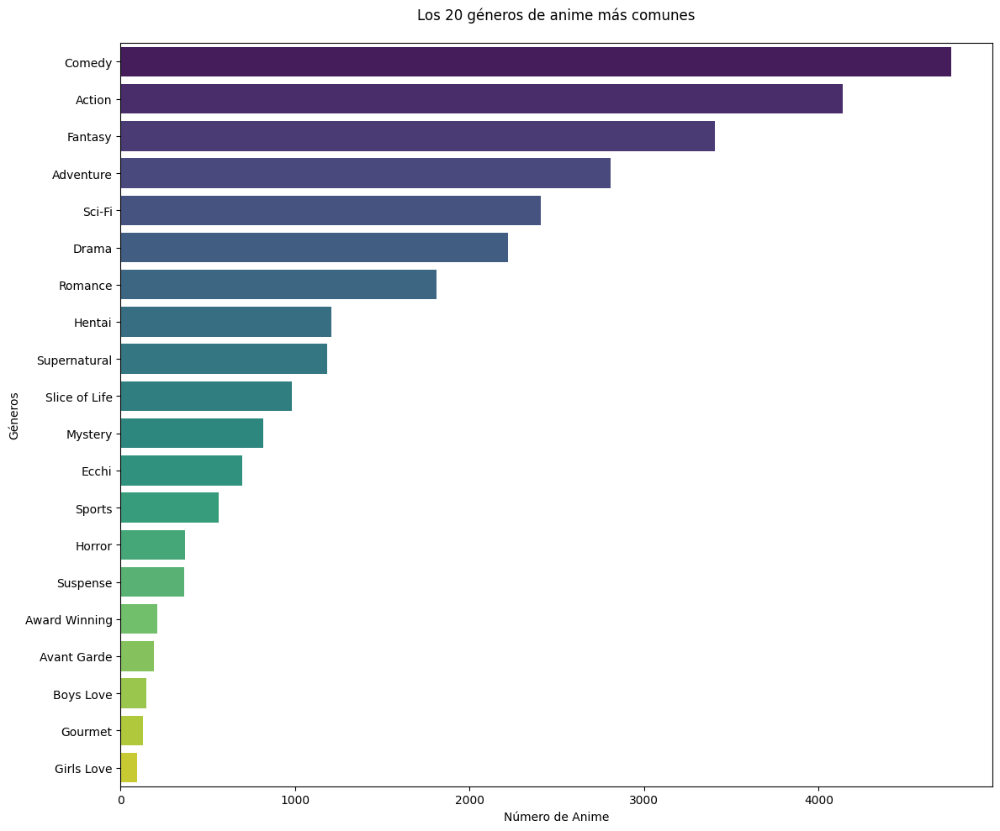

In [ ]:
generos_moda = df_base.drop(['anime_id', 'anime_url', 'image_url', 'japanese_names',  'synopsis', 'type', 'episodes', 'producers', 'studios', 'source', 'duration',  'favorites', 'scored_by', 'members'], axis=1)

generos_expanded = generos_moda['genres'].str.strip('[]').str.split(',').explode()
# Clean up the values by removing whitespace
generos_expanded = generos_expanded.str.strip()

# Get value counts to see frequency of each individual Genero
print("genres distribution:")
print(generos_expanded.value_counts())

# Get the most common demographic
print("\nMost common genres:")
print(generos_expanded.mode())

#-----------grafico--------------
# Set figure size for better visualization
plt.figure(figsize=(12, 10))

# Create horizontal bar plot
theme_counts = generos_expanded.value_counts().head(20)  # Top 20 themes
sns.barplot(x=theme_counts.values, y=theme_counts.index, palette='viridis')

# Customize the plot
plt.title('Los 20 géneros de anime más comunes', pad=20)
plt.xlabel('Número de Anime')
plt.ylabel('Géneros')

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show the plot
plt.show()

themes distribution:
themes
Music                2099
School               1798
Historical            986
Mecha                 945
Adult Cast            600
Military              579
Mythology             527
Super Power           513
Martial Arts          497
Parody                484
Harem                 447
Space                 439
Psychological         366
Isekai                354
Idols (Female)        281
Mahou Shoujo          277
Anthropomorphic       271
Detective             269
Strategy Game         247
Team Sports           236
CGDCT                 236
Gore                  224
Gag Humor             222
Urban Fantasy         191
Samurai               181
Iyashikei             170
Workplace             165
Vampire               154
Idols (Male)          144
Racing                136
Time Travel           131
Video Game            125
Reincarnation         111
Performing Arts       103
Otaku Culture         103
Love Polygon           98
Pets                   89
Organized 

<ipython-input-15-8fc184b66f59>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=theme_counts.values, y=theme_counts.index, palette='viridis')


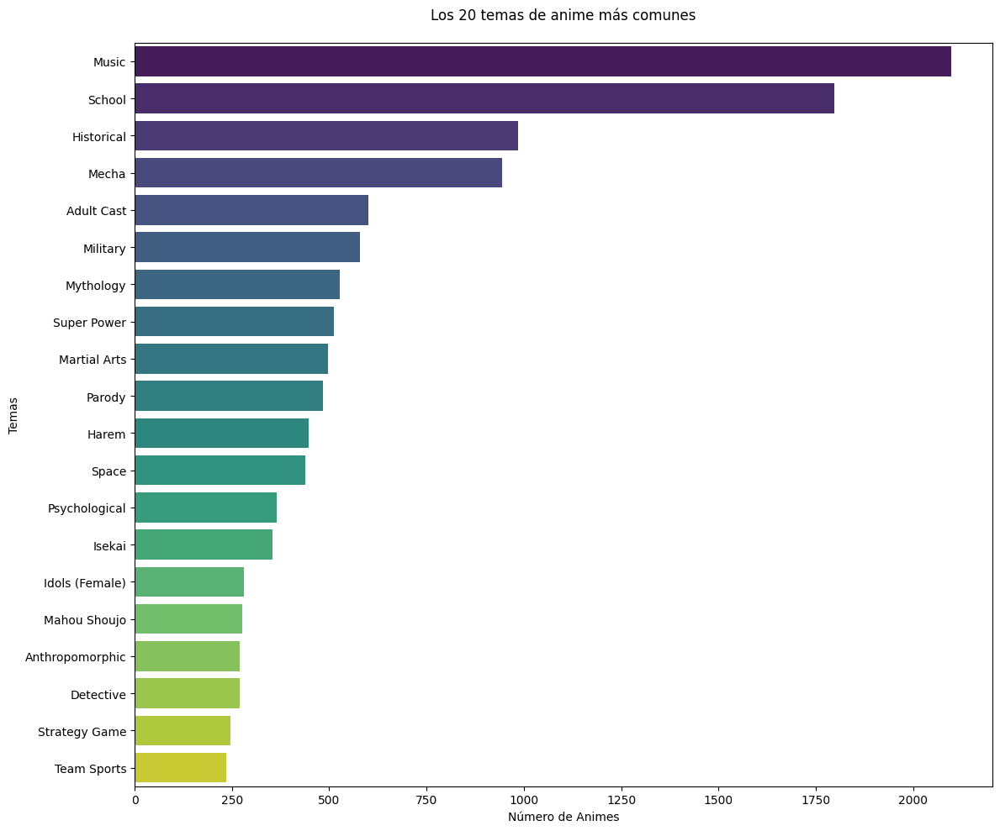

In [ ]:
themes_moda = df_base.drop(['anime_id', 'anime_url', 'image_url', 'japanese_names',  'synopsis', 'type', 'episodes', 'producers', 'studios', 'source', 'duration',  'favorites', 'scored_by', 'members'], axis=1)

themes_expanded = themes_moda['themes'].str.strip('[]').str.split(',').explode()
# Clean up the values by removing whitespace
themes_expanded = themes_expanded.str.strip()

# Get value counts to see frequency of each individual Genero
print("themes distribution:")
print(themes_expanded.value_counts())

#-----------grafico--------------
# Set figure size for better visualization
plt.figure(figsize=(12, 10))

# Create horizontal bar plot
theme_counts = themes_expanded.value_counts().head(20)  # Top 20 themes
sns.barplot(x=theme_counts.values, y=theme_counts.index, palette='viridis')

# Customize the plot
plt.title('Los 20 temas de anime más comunes', pad=20)
plt.xlabel('Número de Animes')
plt.ylabel('Temas')

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show the plot
plt.show()

Rating Distribution:
rating
PG-13 - Teens 13 or older         7526
G - All Ages                      3118
R - 17+ (violence & profanity)    1305
Rx - Hentai                       1205
PG - Children                      936
R+ - Mild Nudity                   842
Name: count, dtype: int64

Percentage Distribution:
rating
PG-13 - Teens 13 or older         50.17
G - All Ages                      20.79
R - 17+ (violence & profanity)     8.70
Rx - Hentai                        8.03
PG - Children                      6.24
R+ - Mild Nudity                   5.61
Name: count, dtype: float64 %


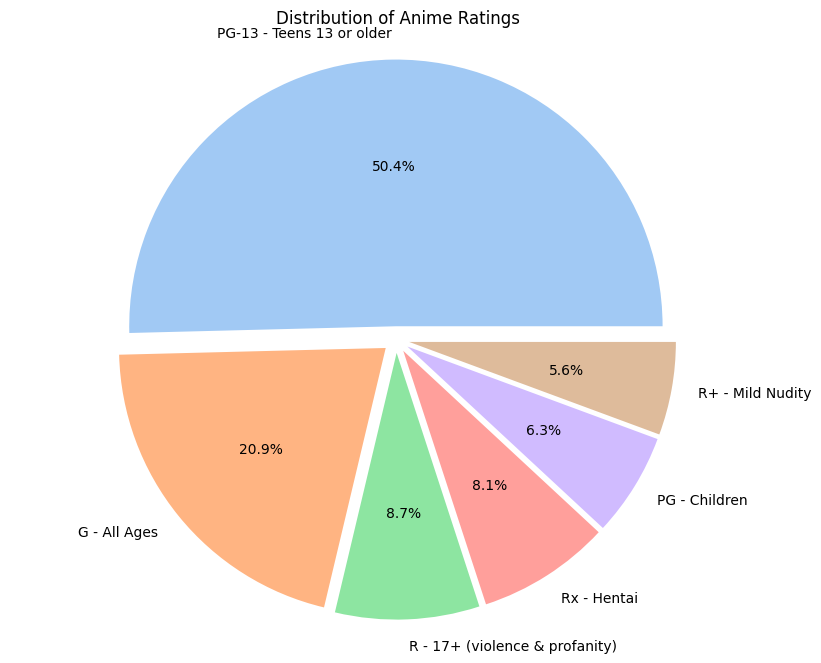

In [ ]:
rating_counts = df_base['rating'].value_counts()

# Create a pie chart
plt.figure(figsize=(10, 8))
plt.pie(rating_counts.values,
        labels=rating_counts.index,
        autopct='%1.1f%%',
        colors=sns.color_palette('pastel'),
        explode=[0.05] * len(rating_counts))

plt.title('Distribution of Anime Ratings')
plt.axis('equal')

# Show the numerical distribution
print("Rating Distribution:")
print(rating_counts)
print("\nPercentage Distribution:")
print((rating_counts/len(df_base) * 100).round(2), "%")

plt.show()

<ipython-input-18-7e6db176ee5e>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=season_counts.index, y=season_counts.values, ax=ax1, palette='Set3')


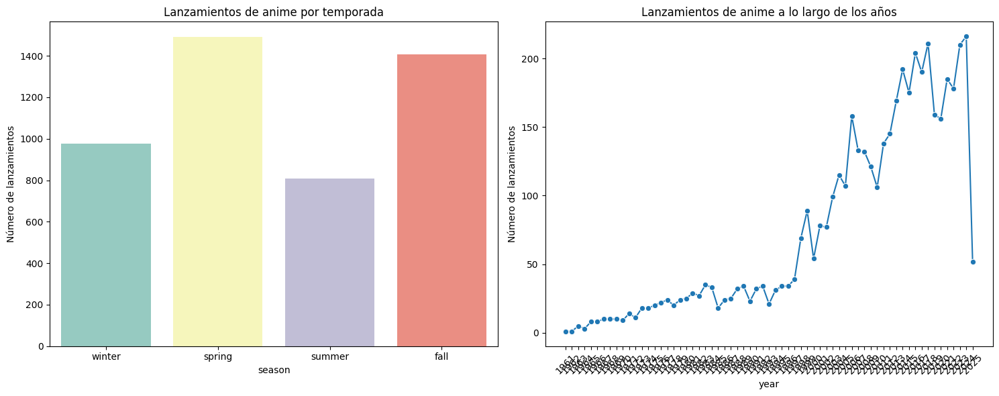


Distribución estacional:
season
winter     978
spring    1490
summer     808
fall      1408
Name: count, dtype: int64

Los mejores años para los lanzamientos de anime:
year
2024    216
2018    211
2023    210
2016    204
2014    192
Name: count, dtype: int64


In [ ]:
# Split premiered into season and year
df_base['season'] = df_base['premiered'].str.split().str[0]
df_base['year'] = df_base['premiered'].str.split().str[1]

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Plot 1: Seasonal Distribution
season_order = ['winter', 'spring', 'summer', 'fall']
season_counts = df_base['season'].value_counts().reindex(season_order)
sns.barplot(x=season_counts.index, y=season_counts.values, ax=ax1, palette='Set3')
ax1.set_title('Lanzamientos de anime por temporada')
ax1.set_ylabel('Número de lanzamientos')

# Plot 2: Yearly Trend
yearly_counts = df_base['year'].value_counts().sort_index()
sns.lineplot(x=yearly_counts.index, y=yearly_counts.values, ax=ax2, marker='o')
ax2.set_title('Lanzamientos de anime a lo largo de los años')
ax2.set_ylabel('Número de lanzamientos')
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# Print numerical statistics
print("\nDistribución estacional:")
print(season_counts)
print("\nLos mejores años para los lanzamientos de anime:")
print(yearly_counts.sort_values(ascending=False).head())

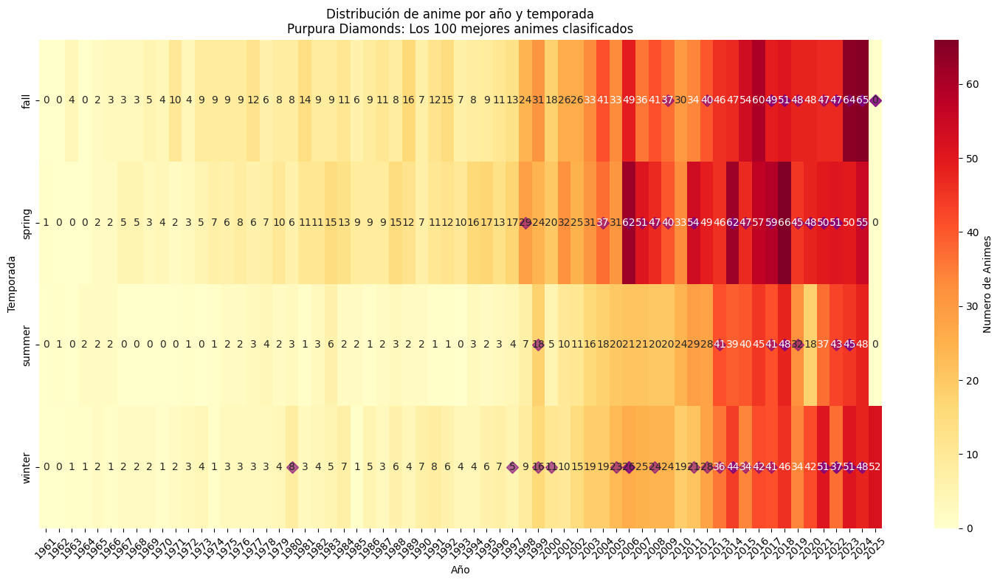

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Create pivot table for heatmap, dropping NaN values
pivot_data = pd.crosstab(
    df_base['season'].dropna(),
    df_base['year'].dropna()
)

# Create figure with larger size
plt.figure(figsize=(15, 8))

# Create heatmap
sns.heatmap(pivot_data, cmap='YlOrRd', annot=True, fmt='d', cbar_kws={'label': 'Numero de Animes'})

# Overlay top 100 ranked anime
top_100 = df_base[
    (df_base['rank'] <= 100) &
    (df_base['season'].notna()) &
    (df_base['year'].notna())
]

for _, anime in top_100.iterrows():
    plt.plot(pivot_data.columns.get_loc(anime['year']) + 0.5,
             season_order.index(anime['season']) + 0.5,
             'D', color='purple', markersize=8, alpha=0.6)

# Customize the plot
plt.title('Distribución de anime por año y temporada\nPurpura Diamonds: Los 100 mejores animes clasificados')
plt.xlabel('Año')
plt.ylabel('Temporada')
plt.xticks(rotation=45)

# Adjust layout
plt.tight_layout()

plt.show()

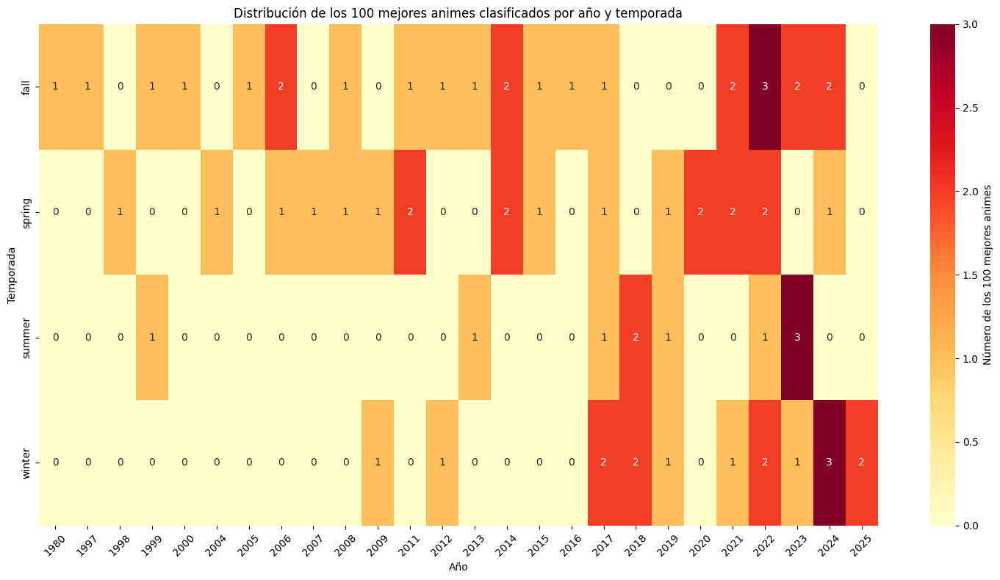


Total number of Top 100 anime by season:
season
fall      25
spring    20
winter    16
summer    10
Name: count, dtype: int64


In [ ]:
# Filter only top 100 ranked anime
top_100 = df_base[
    (df_base['rank'] <= 100) &
    (df_base['season'].notna()) &
    (df_base['year'].notna())
]

# Create pivot table for heatmap with only top 100
pivot_data = pd.crosstab(
    top_100['season'],
    top_100['year']
)

# Create figure
plt.figure(figsize=(15, 8))

# Create heatmap
sns.heatmap(pivot_data,
            cmap='YlOrRd',
            annot=True,
            fmt='d',
            cbar_kws={'label': 'Número de los 100 mejores animes'})

# Customize the plot
plt.title('Distribución de los 100 mejores animes clasificados por año y temporada')
plt.xlabel('Año')
plt.ylabel('Temporada')
plt.xticks(rotation=45)

# Adjust layout
plt.tight_layout()

plt.show()

# Print additional statistics
print("\nTotal number of Top 100 anime by season:")
print(top_100['season'].value_counts())

=== Univariate Analysis ===

Numerical Variables Summary:
              score          rank    popularity
count  15000.000000  11920.000000  15000.000000
mean       6.673692   5947.145302   8492.495600
std        0.703494   3434.731901   5485.410907
min        5.570000      1.000000      1.000000
25%        6.110000   2968.750000   3855.750000
50%        6.580000   5945.500000   7916.500000
75%        7.170000   8917.000000  12583.250000
max        9.310000  11909.000000  21869.000000


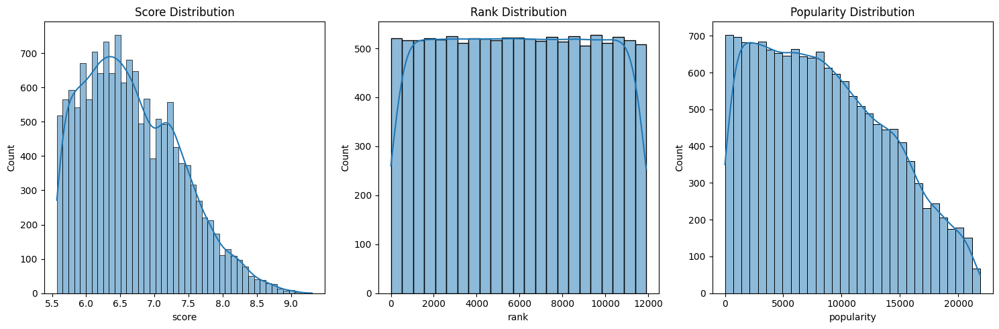


Categorical Variables Distribution:

rating Distribution:
rating
PG-13 - Teens 13 or older         7526
G - All Ages                      3118
R - 17+ (violence & profanity)    1305
Rx - Hentai                       1205
PG - Children                      936
R+ - Mild Nudity                   842
Name: count, dtype: int64

season Distribution:
season
spring    1490
fall      1408
winter     978
summer     808
Name: count, dtype: int64

type Distribution:
type
TV            4716
OVA           2777
Movie         2090
ONA           1788
Music         1489
Special       1296
TV Special     506
CM             207
PV             130
Name: count, dtype: int64

=== Bivariate Analysis ===


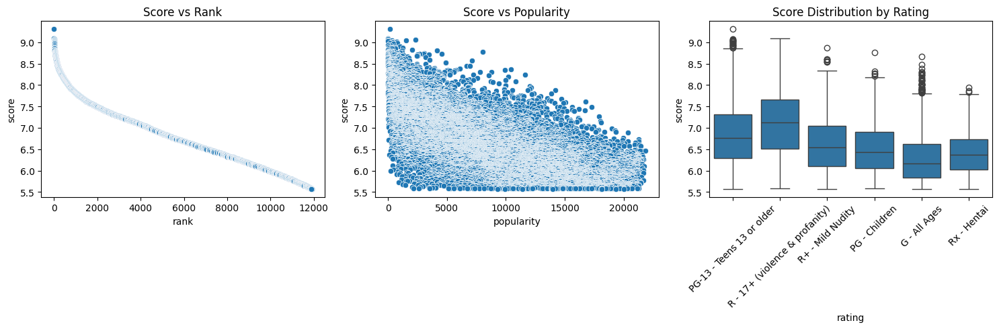


=== Multivariate Analysis ===


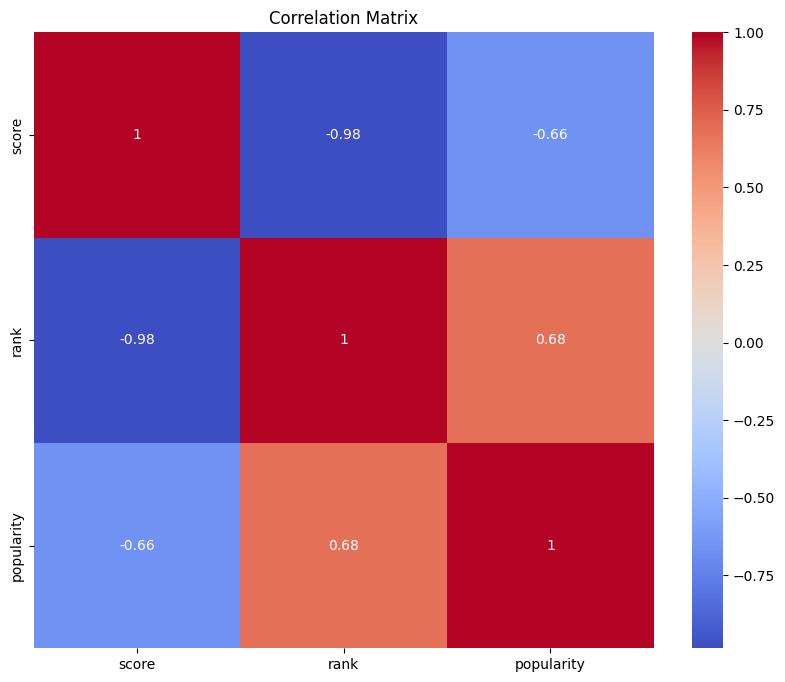

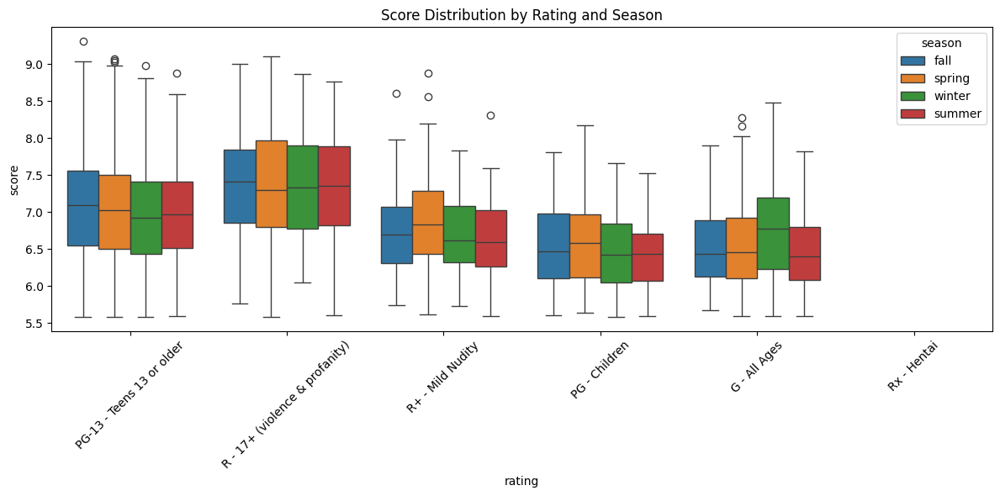


Key Findings:
1. Score Distribution Summary:
count    15000.000000
mean         6.673692
std          0.703494
min          5.570000
25%          6.110000
50%          6.580000
75%          7.170000
max          9.310000
Name: score, dtype: float64

2. Top Correlations:
score         1.000000
popularity   -0.658047
rank         -0.984761
Name: score, dtype: float64


In [ ]:
# Univariate Analysis
print("=== Univariate Analysis ===")

# Numerical variables distribution
print("\nNumerical Variables Summary:")
print(df_base[['score', 'rank', 'popularity']].describe())

# Create histograms for numerical variables
plt.figure(figsize=(15, 5))
plt.subplot(131)
sns.histplot(df_base['score'], kde=True)
plt.title('Score Distribution')

plt.subplot(132)
sns.histplot(df_base['rank'], kde=True)
plt.title('Rank Distribution')

plt.subplot(133)
sns.histplot(df_base['popularity'], kde=True)
plt.title('Popularity Distribution')
plt.tight_layout()
plt.show()

# Categorical variables distribution
print("\nCategorical Variables Distribution:")
for col in ['rating', 'season', 'type']:
    print(f"\n{col} Distribution:")
    print(df_base[col].value_counts())

# Bivariate Analysis
print("\n=== Bivariate Analysis ===")

# Score vs Rank
plt.figure(figsize=(15, 5))
plt.subplot(131)
sns.scatterplot(data=df_base, x='rank', y='score')
plt.title('Score vs Rank')

# Score vs Popularity
plt.subplot(132)
sns.scatterplot(data=df_base, x='popularity', y='score')
plt.title('Score vs Popularity')

# Score by Rating
plt.subplot(133)
sns.boxplot(data=df_base, x='rating', y='score')
plt.xticks(rotation=45)
plt.title('Score Distribution by Rating')
plt.tight_layout()
plt.show()

# Multivariate Analysis
print("\n=== Multivariate Analysis ===")

# Correlation matrix for numerical variables
numerical_cols = ['score', 'rank', 'popularity']
correlation_matrix = df_base[numerical_cols].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix')
plt.show()

# Score distribution by Rating and Season
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_base, x='rating', y='score', hue='season')
plt.xticks(rotation=45)
plt.title('Score Distribution by Rating and Season')
plt.tight_layout()
plt.show()

# Additional insights
print("\nKey Findings:")
print("1. Score Distribution Summary:")
print(df_base['score'].describe())

print("\n2. Top Correlations:")
print(correlation_matrix['score'].sort_values(ascending=False))

In [ ]:
pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 25.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 25.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 45.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 94.0 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=3a2ff0c030d731c999ba830a3808441d67bc6335d7b11f67df1da172e31bfab7
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [ ]:
import pandas as pd
from ydata_profiling import ProfileReport

# Create a profile report
profile = ProfileReport(df_base, title="Anime Dataset Profiling Report")

# Save the report to HTML
profile.to_file("anime_profile_report.html")

# Display the report in the notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 26/26 [00:07<00:00,  3.38it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]